### 1. Basics

Import libraries

In [1]:
from datetime import datetime, timedelta
import scipy.stats
import codecs                     # load UTF-8 Content
import json                       # load JSON files
import pandas as pd               # Pandas handles dataframes
import numpy as np                # Numpy handles lots of basic maths operations
import matplotlib.pyplot as plt   # Matplotlib for plotting
import seaborn as sns             # Seaborn for beautiful plots
from dateutil import *            # I prefer dateutil for parsing dates
import math                       # transformations
import statsmodels.formula.api as smf  # for doing statistical regression
import statsmodels.api as sm      # access to the wider statsmodels library, including R datasets
from collections import Counter   # Counter is useful for grouping and counting
import scipy
from patsy import dmatrices
import statsmodels.formula.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose

%matplotlib inline
plt.rcParams['figure.figsize'] = (20.0, 10.0)

/Users/eelcowiechert/anacona36/anaconda/lib/python3.6/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


Define global functions

In [9]:
def read_events(a_file):
    events = pd.read_csv(a_file, sep=",", names=['id', 'description', 'year', 'month', 'day', 'category'])
    return events

def get_year(year):
    return year.year

def z_score(ys):
    threshold = 3

    mean_y = np.mean(ys)
    stdev_y = np.std(ys)
    z_scores = [(y - mean_y) / stdev_y for y in ys]
    return z_scores[-1]

### 2. Loading the events collected using Google Trends

We have collected a set of events for the years 2005-2016 using Google trends. Google provides trending top 10 list for a variety of catagories, which helps us to indentify events that rise quickly in terms of google searches, and therefore are likely to have an impact from one day to another. Visually exploring the data shows confirms this hypothesis as natural disasters, terrorists attacks and artists that passed away are often presented in these list. 

Although using Google data introduces a bias that follows from the unqueal popularity of Google in all countries, we think this is still a good way to identify 'what keeps people busy?'.

The top 10 trending lists are only made by available through Google Trend for the most recent years. Google Zeitgeist contains top search lists for the earlier years (i.e. before 2009). Note that trending events might have a different character than popular items, which are more stable over time in terms of google searches. In total we collected events in the catagories: *trend, popular, music arist, tech, news,* and *events*.

For the year 2006, we did not find any top google search list and therefore have no events in that year.


---------------------------------------------------------

Preview of the dataset

          description  year  month  day category       date
id                                                         
60           iPhone 6  2014      9    9     tech 2014-09-09
61  Samsung Galaxy S5  2014      2   25     tech 2014-02-25
62            Nexus 6  2014     10   16     tech 2014-10-16
63             Moto G  2014     11   28     tech 2014-11-28
64     Samsung Note 4  2014      8   31     tech 2014-08-31

---------------------------------------------------------

Total number of events: 168

---------------------------------------------------------

Visual overview of events

                    description  month  day  date
year category                                    
2005 trending                 9      9    9     9
2007 popular                 10     10   10    10
2008 popular                 11     11   11    11
2009 popular                 11     11   11    11
2010 popular         

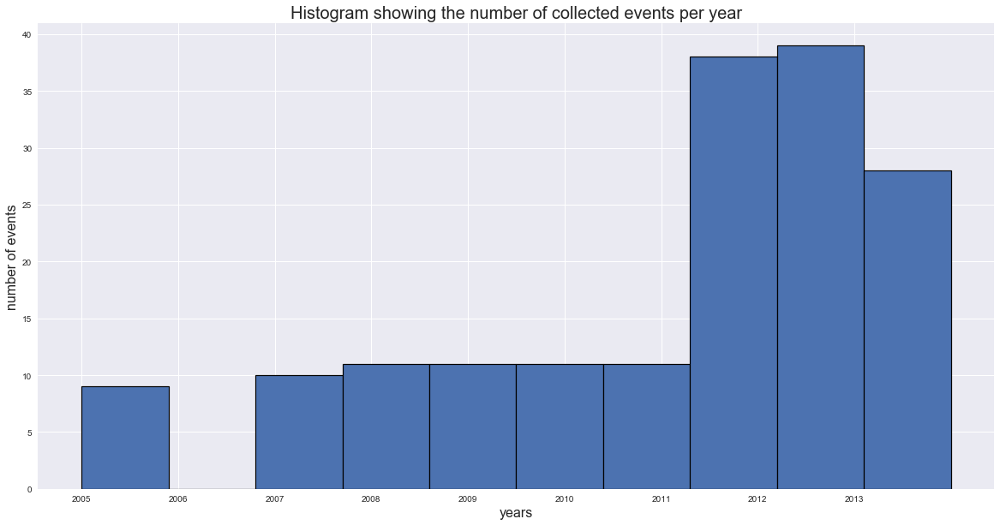

In [4]:
events = read_events("../data/events.csv")

# The dataset has the year, month, and day in three different cells. We would like to have this information in one cell
dates = []
for index, row in events.iterrows():
    date = str(events.iloc[index]['year']) + "-" + str(events.iloc[index]['month']) + "-" + str(events.iloc[index]['day'])
    dates.append(date)

# CREATE A NEW DATA FRAME AND MERGE WITH EVENT DATA FRAME
df2 = pd.DataFrame(dates, columns=['date'])
events = pd.concat([events, df2], axis=1)
events['date'] = pd.to_datetime(events['date'], format='%Y-%m-%d')

# Drop duplicates
events.drop_duplicates(subset=['description', 'date'], keep='first', inplace=True)

# APPLY FILTER TO EVENT DATA FRAME
events_filtered = events[(events['year'] < 2015)]
events_filtered = events_filtered.set_index('id')

print('')
print('---------------------------------------------------------')
print('')

print('Preview of the dataset')
print('')

print(events_filtered.head())

print('')
print('---------------------------------------------------------')
print('')

print('Total number of events: %s' % len(list(events_filtered.description)))

print('')
print('---------------------------------------------------------')
print('')

print('Visual overview of events')
print('')

df_temp = events_filtered.groupby(['year', 'category']).count()
print(df_temp)

plt.hist(list(events_filtered.year), 10, edgecolor='black', linewidth=1.2)
print(set(list(events_filtered.year)))
plt.title('Histogram showing the number of collected events per year', fontsize = 20)
plt.xticks( np.arange(2005,2014,1) )
plt.xlabel('years', fontsize = 16)
plt.ylabel('number of events', fontsize = 16)

#### Number of listeners per day
Analysing the data showed that the number of listeners varies heavily over the days. Although this might be caused by an event, it can also hide other possible valuable information. We therefore create a three new signals, which are transformations of the three components. 

Exploring the number of listeners per day showed that there a repeating patterns in the data that we should filter out. For example, weekend days seem to have an negative effect on the number of people who listen music. Leaving this bias in the data possibly cause assigning found effects to an event which are actually caused by the event taking place on a weekend day. Thererfore, we split the the number of unique listeners into the same three components (i.e. trend, seasonal, and residual) and remove the seasonal component from the original signal.

This causes some issues. Following from the unequal distribution of unqiue listeners per year. I.e., for the early years - before 2010 - the number of users in the dataset is much lower than for the remaining years, with a large peak in the year 2012. The seasonality component do not compensate for the difference in users, as it identifies a best fitting repeating pattern over the whole time series that is equally strong throughout the years. 

### Q: Would it be better to take samples of users, so we have an equal distribution?


Figure 1: Decomposition of the number of listeners

            original   residual    seasonal    trend  \
date                                                   
2005-02-14    1042.0        NaN   83.427348      NaN   
2005-02-15    1100.0        NaN   67.951267      NaN   
2005-02-16    1139.0        NaN -244.340376      NaN   
2005-02-17     999.0        NaN  -85.437206      NaN   
2005-02-18     894.0 -69.713673  -84.664341  1031.05   

            unqiue_listeners_per_day_NOF  trend_NOF  seasonal_NOF  \
date                                                                
2005-02-14                            73        NaN    120.454946   
2005-02-15                            77        NaN    264.958826   
2005-02-16                            75        NaN    271.203149   
2005-02-17                            68  69.571429    262.642262   
2005-02-18                            73  69.571429    198.903880   

            residual_NOF  
date                      
2005-02-14      

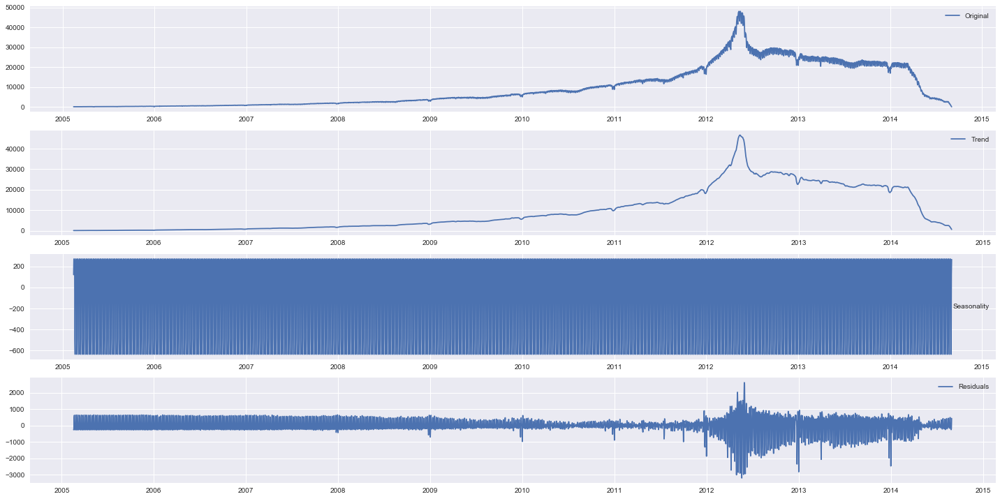

In [5]:
# Loading a dataframe that contains the unqiue number of listeners per day
unqiue_listeners_per_day = pd.DataFrame(json.load(open("../data/unique_users_per_day.json")))
unqiue_listeners_per_day['date'] = pd.to_datetime(unqiue_listeners_per_day['date'], format='%Y-%m-%d')
unqiue_listeners_per_day.set_index('date', inplace=True)
unqiue_listeners_per_day.sort_index(inplace=True)
unqiue_listeners_per_day = unqiue_listeners_per_day.drop(list(unqiue_listeners_per_day[unqiue_listeners_per_day.index < '2005-02-14'].index))
unqiue_listeners_per_day = unqiue_listeners_per_day.drop(list(unqiue_listeners_per_day[unqiue_listeners_per_day.index > '2015-12-31'].index))

# perform the decomposition of the unique listeners per day
decomposition = seasonal_decompose(unqiue_listeners_per_day)
trend_NOF = decomposition.trend
seasonal_NOF = decomposition.seasonal
residual_NOF = decomposition.resid

print('')
print('Figure 1: Decomposition of the number of listeners')
print('')

plt.subplot(411)
plt.plot(unqiue_listeners_per_day, label='Original')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(trend_NOF, label='Trend')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(seasonal_NOF,label='Seasonality')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(residual_NOF, label='Residuals')
plt.legend(loc='best')
plt.tight_layout()

unqiue_listeners_per_day = pd.concat([unqiue_listeners_per_day, trend_NOF, seasonal_NOF, residual_NOF], axis=1)
unqiue_listeners_per_day.columns = ['unqiue_listeners_per_day_NOF', 'trend_NOF', 'seasonal_NOF', 'residual_NOF']

# We load a dataframe that contains the absolute playcount per genre for each country on a daily basis. 
#This data is obtained from the - itemLE_10000_userLE_1000 -  files as created by Markus.
df = pd.DataFrame(json.load(open("../data/TSA_one_genre_components.json")))
df['date'] = pd.to_datetime(df['date'], format='%Y-%m-%d')
df['original'] = df['original'].astype('float64')
df['trend'] = df['trend'].astype('float64')
df['seasonal'] = df['seasonal'].astype('float64')
df['residual'] = df['residual'].astype('float64')
#df.set_index('date', inplace=True)
df = df.groupby(['date']).sum()
#df['year'] = df.index.map(get_year)

# Merge both dataframes
df = pd.concat([df, unqiue_listeners_per_day], axis=1, join='inner')
#df['rel_residuals'] = df['residual'] / df['number_of_unqiue_listeners']
#df['rel_trend'] = df['trend'] / df['number_of_unqiue_listeners']
print(df.head())

## Regression discontinuity design

Our listening behavior varies heavily over time in terms of the type of music we listen to (e.g. Pop, Rock, Michael Jackson, Coldplay) and the time we spend on listening music. We are interested in possible changes in listening behavior, with respect to the listening time and type of music listened, that might be caused by a world event. 

For each event, we collect a set of statistics with respect to the number of listening events and the number of unique listeners on a daily basis. For both signals, we are interested types of changes: short term and long term influences. Short term influences concern signal changes from the day before the event to the day of the event. Long term changes consider changes between a week before and after the event.

### Decomposing the signals

For the analyis, decompose both the number of listening events and the number of unique listeners into a trend, seasonal and residual component. The trend component includes changes over a longer period of time and is therefore useful to investigate changes between the week before and after the event. 
The signal does not include information about returning patterns in the data that might be caused by the occurence of the weekend for example. For our analysis, we would like to remove any information in the signal that can be predicted because of their reoccuring behavior. For example, in case we would not do this, we might assign a change in the signal to an event, while it is cause by the start of the weekend. 
Any information that could not be explained by one of both components is presented in the residual signal that contains the noise. This signal contains information about rapid changes in the data and we therefore use this signal to identify changes on a short term.

### Identifying long term influences

We perform an regression discontinuity analysis to identify any changes between the week before and after the event that differ from the overarching trend. I.e., the overarching trend during the month/quarter/year of the event might indicates that the number of people who listen music increases steady, however we are interested if this increase might be temporary reduced or increased because of the event.
In order to identify these influences, we focus ourselves on a period of two weeks starting from week before the event and fit a linear line to each signal. We allow the line to fit itself best on data of the first and last 7 days. To do this, we add a dummy variable (threshold) to the dataset which is 0 for all days before the event, and 1 for all days after. In case this value contributes significantly to prediction of the variable concerned, we consider it as a discontinuity of the signal, possibly caused by the event. We use trend component of the signals of the number of unqiue users and number of listening events as this represents changes over a longer period of time. 

### Identifying short term influences

Short term changes concern a drop of increase of the signal from the day before the event to the day of the event itself. Exploring the dataset showed that both the number of listeners, as well as the number of listening events signal are very unstable and therefore always differ from predecessor value. For our research question, we are concerned about above average changes possibly caused by the event. This implies that we are looking for a value that is deviates from its predecssor more than the average change the days before. We therefore calculate the z-score of the delta for the day of the event with respect to the population comprising the 7 days before. A z-score of 3 or higher indicates an ourlier and therefore a possible effect caused by the event.

### Obtaining quantitative data for each events
After performing the regression analysis and the t-test, we end up with a set of statistics for each event. We will create a Pandas dataframe containing these statistical numbers, below we explain each value.

#### R2-values (one per trend signal)

The R2 value indicates the proportion of the variance in the dependent variable that is predictable using the two regression components. A higher value supports the claim of a linear course of the signal and indicates that the coefficients are good predictors of the signal, while a low value indicates the opposite.

#### Coefficient and P-value (two or each per trend signal)
For each signal we have two coefficients and p-values that indicate the value of the predictor and if its contributes signifiancly to the predictor of the signal. Both only tell something about changes on the long term. The DTE coefficient represents a linear trend: a positive coefficient implies that there is a linear increase of the number of listening events over the periode of interest, while a negative number implies a decrease). The threshold value represents a difference between the time period before and after the event, and indicate a higher signal value after the event when the coefficient is positive, while a negative coefficient indicates a lower signal after the event. In case the coefficient is 0, not enough data is available to perform a regression analysis.
The p-values indicate if the coefficients adds significantly to the prediction f the absolute playcount. In case the p-value for the corresponding coeffcient is higher than 0.05, we consider that it does not significantly add to the prediction of the signal value.

#### Z-score (one per residual signal)
The Z-score indicates how far the score is from the average, with an absolute score higher than 3 indating the value to be an outlier. 

/Users/eelcowiechert/anacona36/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/eelcowiechert/anacona36/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/eelcowiechert/anacona36/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may co

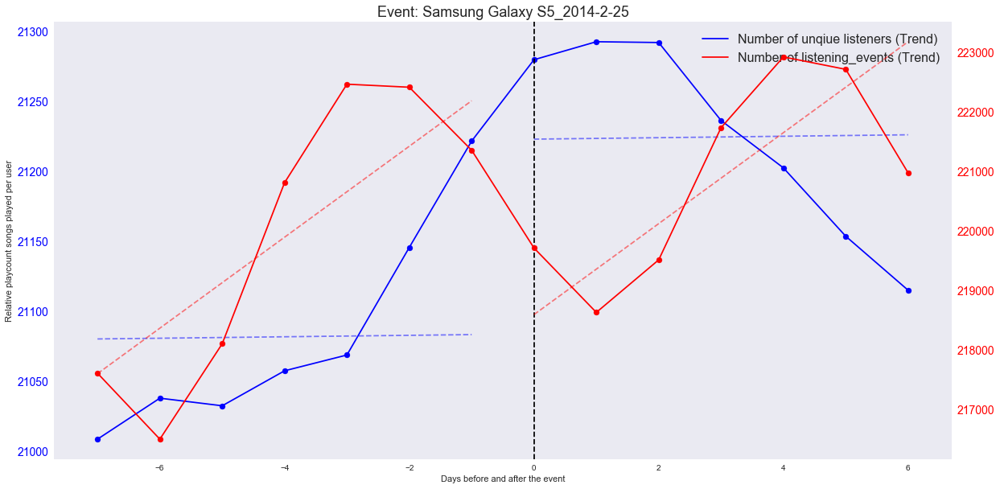

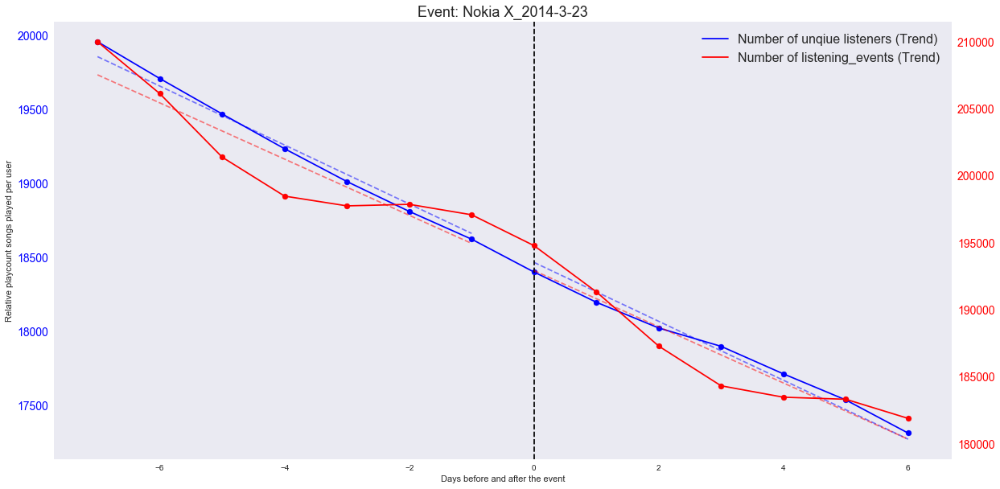

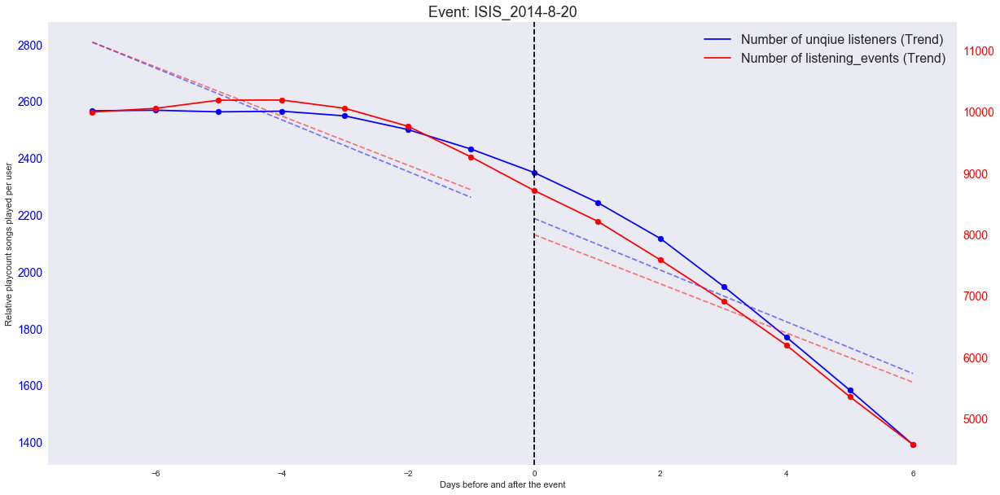

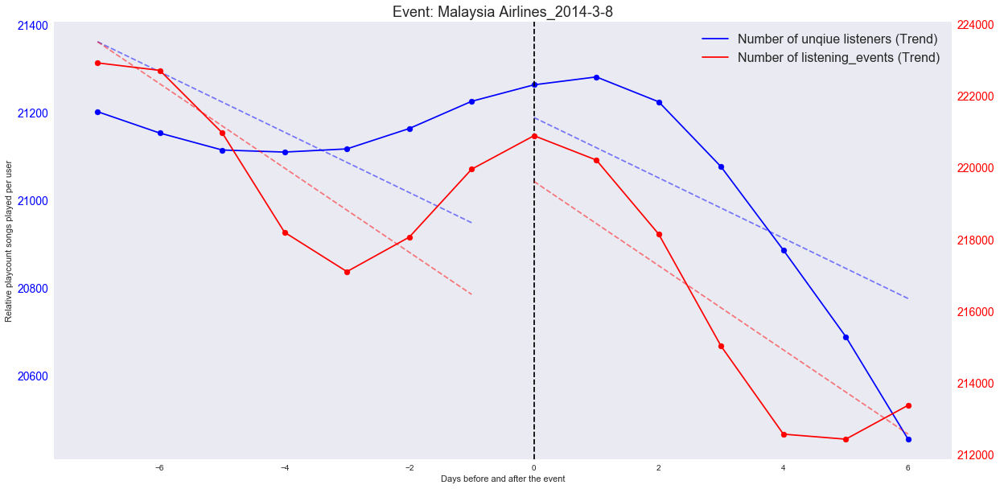

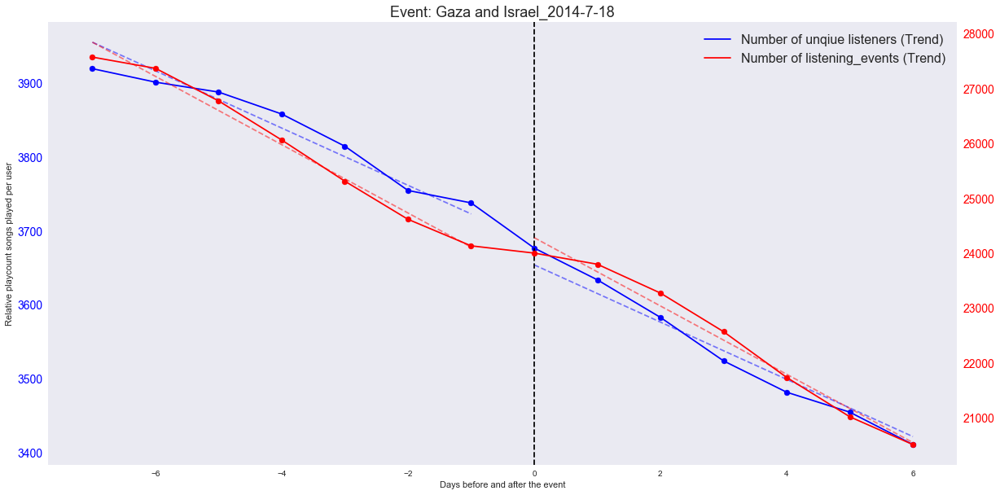

...

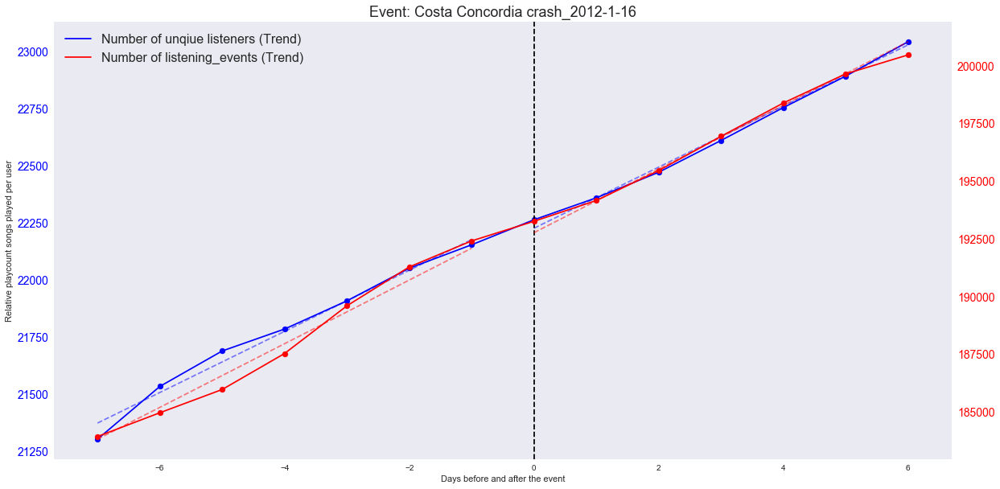

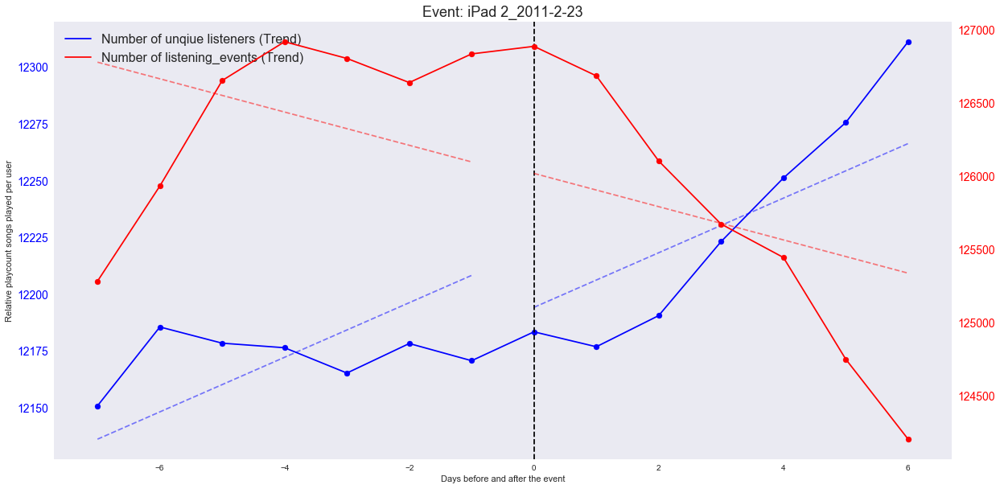

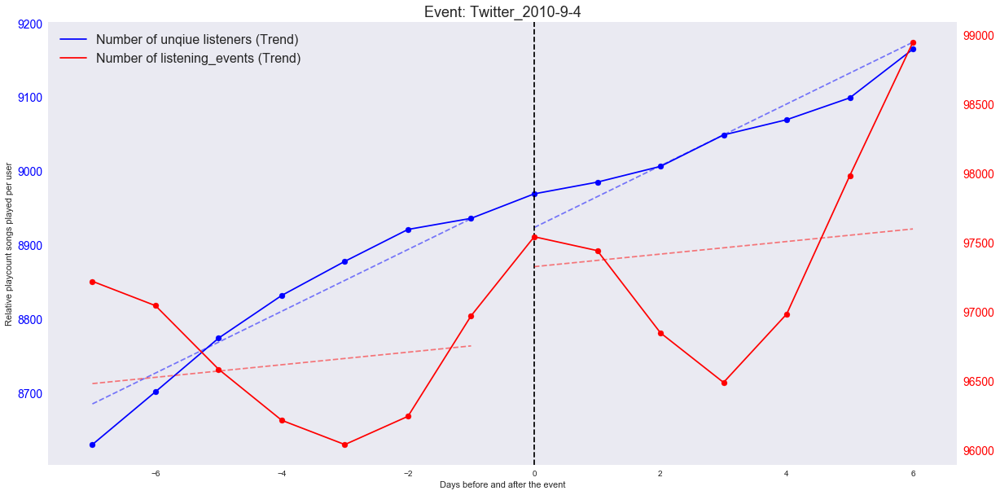

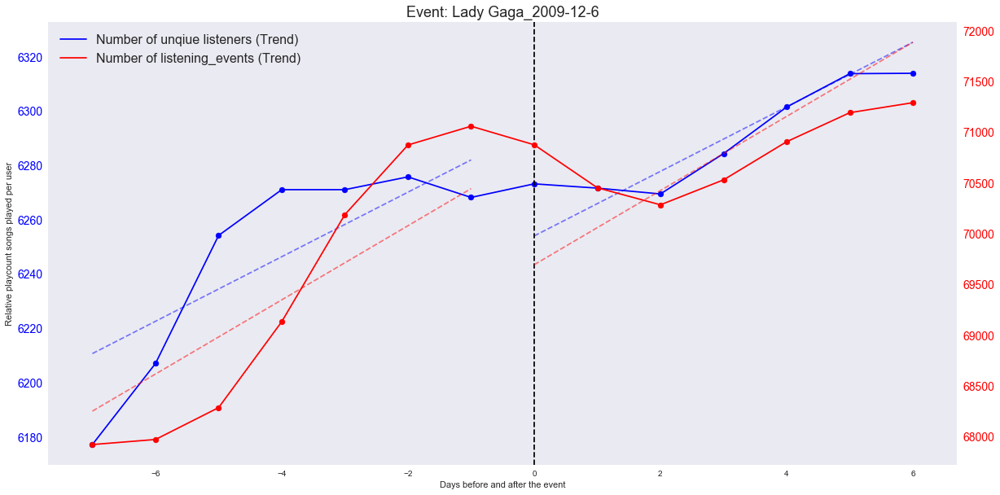

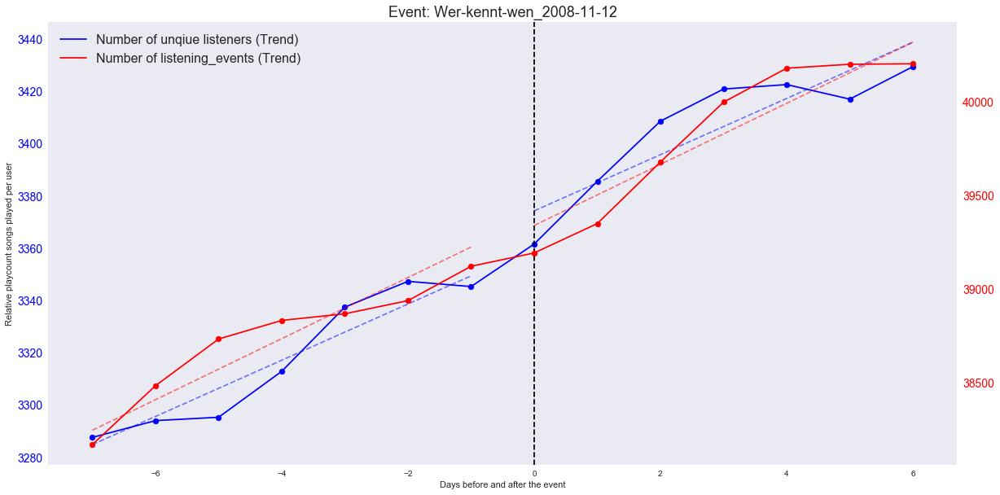

In [56]:
temp_dic = {}

for index, row in events_filtered.iterrows():
    dateEvent = row.date
    dateBefore = row.date - timedelta(days=7)
    dateAfter = row.date + timedelta(days=7)

    def threshold(size):
        if(size>=dateEvent):
            return 1
        return 0

    def days_to_event(size):
        delta = size - dateEvent
        return delta.days

    # WE ONLY CONSIDER 7 DAYS BEFORE AND AFTER THE EVENT
    data = df[(df.index < dateAfter) & (df.index >= dateBefore)]

    # WHEN THE FILTERING RETURNS AN EMPTY DATAFRAME => CONTINUE
    if len(list(data['trend'])) < 14:
        #temp_dic[index] = {'r_value_short':0, 'DTE_stat_short':0, 'threshold_stat_short':0, 'DTE_p_value_short':0, 'threshold_p_value_short':0}
        continue

    data['threshold'] = data.index.map(threshold)
    data['days_to_event'] = data.index.map(days_to_event)

    listening_events = sm.ols(formula="trend ~ threshold + days_to_event", data=data).fit()
    number_unique_listeners = sm.ols(formula="trend_NOF ~ threshold + days_to_event", data=data).fit()
    
    # Calculate z-score
    
    # unique listeners
    differences = []
    values = list(data['residual_NOF'])
    n=0
    for delta in range(7):
        differences.append(values[n]-values[n+1])
        n+=1
    z_unique_listeners = z_score(differences) 
    
    # number of LE
    differences = []
    values = list(data['residual'])
    n=0
    for delta in range(7):
        differences.append(values[n]-values[n+1])
        n+=1
    z_listening_events = z_score(differences) 
        
    
    temp_dic[index] = {'r_value_listening_events':listening_events.rsquared, 
                       'DTE_stat_listening_events':listening_events.params.days_to_event, 
                       'threshold_stat_listening_events':listening_events.params.threshold, 
                       'DTE_p_value_listening_events':listening_events.pvalues.days_to_event, 
                       'threshold_p_value_listening_events':listening_events.pvalues.threshold, 
                       'r_value_number_unique_listeners':number_unique_listeners.rsquared, 
                       'DTE_stat_number_unique_listeners':number_unique_listeners.params.days_to_event, 
                       'threshold_stat_number_unique_listeners':number_unique_listeners.params.threshold, 
                       'DTE_p_value_number_unique_listeners':number_unique_listeners.pvalues.days_to_event, 
                       'threshold_p_value_number_unique_listeners':number_unique_listeners.pvalues.threshold,
                       'z_unique_listeners':z_unique_listeners, 
                       'z_listening_events':z_listening_events}
    
    if listening_events.pvalues['threshold'] <0.05 or number_unique_listeners.pvalues['threshold']:
        fig, ax1 = plt.subplots()
        plt.figure(num=None, figsize=(8, 4), dpi=80, facecolor='w', edgecolor='k')
        
        ax1.scatter(data.days_to_event,data.trend_NOF, color="blue",label='_nolegend_')
        l1 = ax1.plot(data.days_to_event, data.trend_NOF, '-', color='blue', label='Number of unqiue listeners (Trend)')
        ax1.plot(data.days_to_event[:7], number_unique_listeners.predict()[:7], '--', color='blue', alpha=0.5)
        ax1.plot(data.days_to_event[7:], number_unique_listeners.predict()[7:], '--', color='blue', alpha=0.5)
        ax1.axvline(x=0,color="black", linestyle="--")
        ax1.tick_params('y', colors='blue', labelsize=14)
        ax1.grid(False)
        
        ax4 = ax1.twinx()
        
        ax4.scatter(data.days_to_event,data.trend, color="red",label='_nolegend_')
        l4 = ax4.plot(data.days_to_event, data.trend, '-', color='red', label='Number of listening_events (Trend)')
        ax4.plot(data.days_to_event[:7], listening_events.predict()[:7], '--', color='red', alpha=0.5)
        ax4.plot(data.days_to_event[7:], listening_events.predict()[7:], '--', color='red', alpha=0.5)
        ax4.tick_params('y', colors='red', labelsize=14)
        ax4.grid(False)
        
        ax1.set_xlabel('Days before and after the event')
        ax1.set_ylabel('Relative playcount songs played per user')
        ax1.set_title("Event: " + str(row.description) + '_' + str(row.year) + '-'+ str(row.month) + '-'+ str(row.day), fontsize="18")
        lns = l1+l4
        labs = [l.get_label() for l in lns]
        legend = ax1.legend(lns, labs, loc=0, fontsize=16)
    
RDD_analysis = pd.DataFrame.from_dict(temp_dic, orient='index')

DF = pd.concat([events_filtered, RDD_analysis], axis=1, join_axes=[events_filtered.index])
DF = DF.dropna()

## Identifying events that cause a difference

Now we have performed our long and short term analysis, we would like to answer the followin research question:


<center>*Are there certain categories that have an influence on the listening behavior? If so, what kind of change*</center>

### Short term influences

Short time influences that are possibly caused by the event result in a significant different number of listeners or songs played in contrast to the previous day. We use the the Z-test to identify if the differences of one of the signals deviates significantly from the deviations shown on the days prior to the event. We defined an absolute score of 3 or higher as a ourlier. In Figure 2, we provide an overview of all items for which one of the two signals score higher than 3. In Figure 3 we provide a graphical plot of the Z-scores for all events.


Figure 2: Events for which the number of listeners or songs played in contrast to the previous day differs significanlty

-------------------------------------------------------------


-------------------------------------------------------------


Figure 3: Graphical representation of all Z-scores per catagory

-------------------------------------------------------------



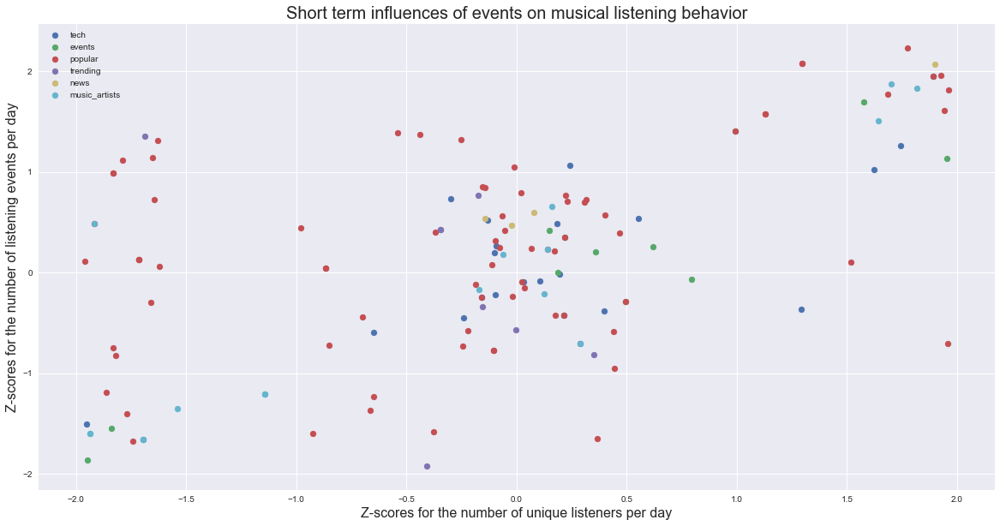

In [28]:
print('')
print('Figure 2: Events for which the number of listeners or songs played in contrast to the previous day differs significanlty')

print('')
print('-------------------------------------------------------------')
print('')

for index, row in DF.iterrows():
    if abs(row.z_unique_listeners) > 3 or abs(row.z_listening_events) > 3:
        print(row)
    
print('')
print('-------------------------------------------------------------')
print('')

print('')
print('Figure 3: Graphical representation of all Z-scores per catagory')


for cat in set(DF['category']):
    tempDF = DF[DF.category == cat]
    plt.scatter(list(tempDF['z_unique_listeners']), list(tempDF['z_listening_events']), label=cat)

plt.xlabel('Z-scores for the number of unique listeners per day', fontsize=16)
plt.ylabel('Z-scores for the number of listening events per day', fontsize=16)
plt.title('Short term influences of events on musical listening behavior', fontsize=20)
plt.legend()

print('')
print('-------------------------------------------------------------')
print('')

### Long term influences

Analysing the long term influences less straightforward than the short term influences. First, we identify the event  for which events the linear regression was discontinued for either the *unqiue number of listeners*, the *number of listening events*, or both. This is indicated indicated by a p-value lower than 0.05 for the *threshold* predictor.

In Figure 4, we plot the coefficients for the components that model the linearity.


Figure 4: 

-------------------------------------------------------------



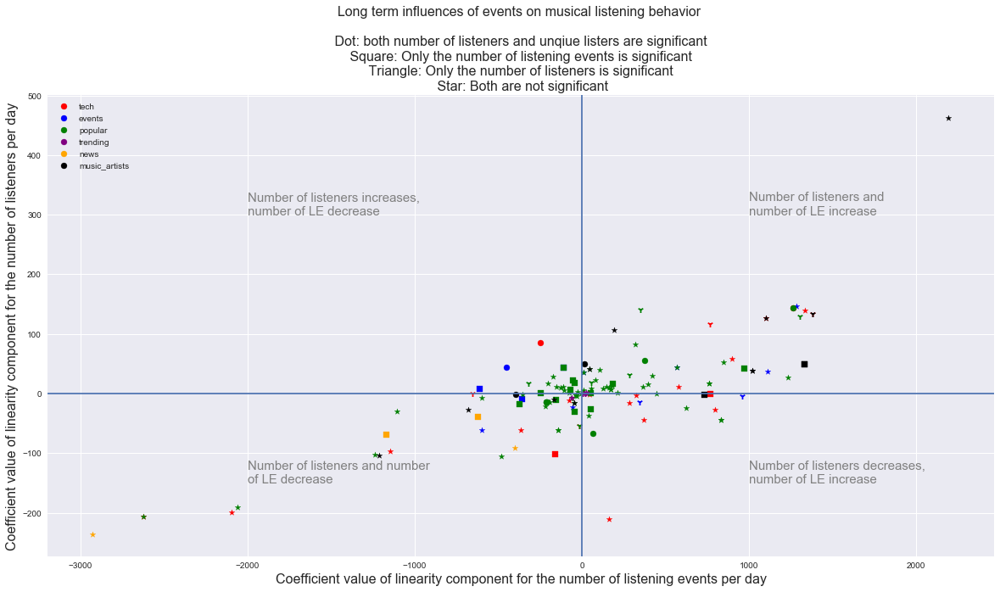

In [55]:
print('')
print('Figure 4: ')

colors = ['red', 'blue', 'green', 'purple', 'orange', 'black']

plt.axvline(x=0, ymin=-300, ymax=700)
plt.axhline(y=0, xmin=-4000, xmax=8000)

n=0
for cat in set(DF['category']):
    
    tempDF = DF[((DF.category == cat) & (DF.threshold_p_value_listening_events <0.05) & (DF.threshold_p_value_number_unique_listeners < 0.05))]
    plt.scatter(list(tempDF['DTE_stat_listening_events']), list(tempDF['DTE_stat_number_unique_listeners']), label=(cat), color=colors[n])
    
    tempDF = DF[((DF.category == cat) & (DF.threshold_p_value_listening_events <0.05) & (DF.threshold_p_value_number_unique_listeners > 0.05))]
    plt.scatter(list(tempDF['DTE_stat_listening_events']), list(tempDF['DTE_stat_number_unique_listeners']), label='_nolegend_', marker='s', color=colors[n])
    
    tempDF = DF[((DF.category == cat) & (DF.threshold_p_value_listening_events >0.05) & (DF.threshold_p_value_number_unique_listeners < 0.05))]
    plt.scatter(list(tempDF['DTE_stat_listening_events']), list(tempDF['DTE_stat_number_unique_listeners']), label='_nolegend_', marker='1', color=colors[n])
    
    tempDF = DF[((DF.category == cat) & (DF.threshold_p_value_listening_events >0.05) & (DF.threshold_p_value_number_unique_listeners > 0.05))]
    plt.scatter(list(tempDF['DTE_stat_listening_events']), list(tempDF['DTE_stat_number_unique_listeners']), label='_nolegend_', marker='*', color=colors[n])
    
    n+=1
    
plt.xlabel('Coefficient value of linearity component for the number of listening events per day', fontsize=16)
plt.ylabel('Coefficient value of linearity component for the number of listeners per day', fontsize=16)
plt.title('Long term influences of events on musical listening behavior \n \n Dot: both number of listeners and unqiue listers are significant \n Square: Only the number of listening events is significant \n Triangle: Only the number of listeners is significant \n Star: Both are not significant', fontsize=16)
plt.legend()
plt.text(-2000, -150, 'Number of listeners and number \nof LE decrease', fontsize=15, color='grey')
plt.text(-2000, 300, 'Number of listeners increases, \nnumber of LE decrease', fontsize=15, color='grey')
plt.text(1000, -150, 'Number of listeners decreases, \nnumber of LE increase', fontsize=15, color='grey')
plt.text(1000, 300, 'Number of listeners and \nnumber of LE increase', fontsize=15, color='grey')

print('')
print('-------------------------------------------------------------')
print('')